<a href="https://colab.research.google.com/github/sk27110/basic_ml_hse/blob/task_3/homework_03_regression_with_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Основы машинного обучения, ПАДиИИ

## НИУ ВШЭ, 2024-25 учебный год

# Домашнее задание 3. Регрессия и инференс модели

Задание выполнил(а):

    Кочетков Александр


В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
*  реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашнее задание = $min(\text{ваш балл}, 11)$

## Общая информация

__Внимание!__  

* Домашнее задание выполняется самостоятельно
* Не допускается помощь в решении домашнего задания от однокурсников или третьих лиц. «Похожие» решения считаются плагиатом, и все задействованные студенты — в том числе и те, у кого списали, — не могут получить за него больше 0 баллов
* Использование в решении домашнего задания генеративных моделей (ChatGPT и так далее) за рамками справочной и образовательной информации для генерации кода задания — считается плагиатом, и такое домашнее задание оценивается в 0 баллов

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

## Импорт библиотек, установка констант

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

In [168]:
CARS_TRAIN = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_train.csv'
CARS_TEST = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_test.csv'

In [63]:
RANDOM_STATE = 42

In [64]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

## Задание 0

Для чего фиксируем сиды в ноутбуке?

Для повторяемости результата. То-есть мы хотим получить результат на каких-то фиксированных данных и его улучшать, а иначе наша модель может меняться из-за рандомных параметров и мы не поймем, как конкретно наши действия влияют на результат.

## Часть 1 | EDA




Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [169]:
df_train = pd.read_csv(CARS_TRAIN)
df_test = pd.read_csv(CARS_TEST)

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling) (0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [48]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 392.1/392.1 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 93.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=218e44da42a49bc147f58315f1b260727b2ef460280293ab65160f5e1d267fb2
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [49]:
from ydata_profiling import ProfileReport

df = pd.concat([df_train, df_test], ignore_index=True)

print("Пропуски в df:", df.columns[df.isna().any()].tolist())
print("Число дубликатов", df.duplicated().sum())
profile = ProfileReport(df, title="Profiling Report")
print(profile.to_widgets())


Пропуски в df: ['mileage', 'engine', 'max_power', 'torque', 'seats']
Число дубликатов 1170


/usr/local/lib/python3.11/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

None


Целевая переменная -- selling_price

Сильнокоррелированные признаки -- selling_price и year, transmission и selling_price

Признаки с отрицательной корреляцией -- year и km_driven, km_driven и selling_price


### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [170]:
from IPython.display import display

print("Train: ")
display(df_train.describe(include='number'))
display(df_train.describe(include='object'))
print("Test: ")
display(df_test.describe(include = 'number'))
display(df_test.describe(include='object'))


Train: 


,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


Test: 


,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


Распределение данных по выборкам схоже. В столбцах selling_price и km_driven среднее выше медианы, что может говорить о выбросах в данных (есть очень дорогие автомоболи и автомобили с большим пробегом)

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [171]:
df_train_without_price = df_train.drop('selling_price', axis=1)
print("Число пропусков:", df_train_without_price.duplicated().sum())
duplicates = df_train_without_price[df_train_without_price.duplicated(keep=False)]
display(duplicates)
df_train = df_train.drop_duplicates(subset=df_train_without_price.columns, keep='first').reset_index(drop=True)

Число пропусков: 1159


,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [172]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [173]:
import re

def transform_mil(row):
  if pd.isna(row['mileage']):
    return np.nan
  unit_mileage = re.sub(r'[\d.]+', '', row['mileage']).strip()
  if re.sub(r'[\d.]+', '', unit_mileage).strip() == "km/kg":
    if row['fuel'] == 'Petrol':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.75
    elif row['fuel'] == 'LPG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    elif row['fuel'] == 'CNG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.13
  return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])


def transform_engine(x):
  if pd.isna(x):
    return np.nan
  return int(re.findall(r'\d+\.?\d*', str(x))[0])


def transform_max_power(row):
  if pd.isna(row):
    return np.nan
  try:
    return float(re.findall(r'\d+\.?\d*', str(row))[0])
  except:
    return np.nan


def transform_torque(row):
  if pd.isna(row['torque']):
    return row

  unit_torque = np.nan
  if not (pd.isna(row['torque'])):
    unit_torque = re.sub(r'[^a-zA-Z]|at', '', row['torque']).lower()

  numbers = re.findall(r'\d+(?:[\.,]\d+)?', row['torque'].replace(",", ""))
  for i in range(len(numbers)):
    numbers[i] = float(numbers[i].replace(',', '.'))

  #получаем наши параметры
  torque = np.nan
  max_torque_rpm = np.nan

  if(len(numbers)>=1):
    torque=numbers[0]

  if len(numbers)==2:
    max_torque_rpm = numbers[1]
  elif len(numbers)==3:
    max_torque_rpm = (numbers[1] + numbers[2])/2

  row['max_torque_rpm'] = max_torque_rpm

  if unit_torque == 'kgmrpm':
    row['torque'] = torque*9.807
  elif unit_torque == 'nmrpm':
    row['torque'] = torque
  else:
    row['torque'] = np.nan
  return row


def transform_seats(x):
  if pd.isna(x):
    return 'missing'
  return str(x)



#обработаем mileage
df_test['mileage'] = df_test.apply(transform_mil, axis=1)
df_train['mileage'] = df_train.apply(transform_mil, axis=1)

#обработаем engine
df_train['engine'] = df_train['engine'].apply(transform_engine)
df_test['engine'] = df_test['engine'].apply(transform_engine)
#обработаем max_power
df_train['max_power'] = df_train['max_power'].apply(transform_max_power)
df_test['max_power'] = df_test['max_power'].apply(transform_max_power)

#обработаем torque
df_train['max_torque_rpm'] = np.nan
df_test['max_torque_rpm'] = np.nan

df_train = df_train.apply(transform_torque, axis=1)
df_test = df_test.apply(transform_torque, axis=1)



In [153]:
# import re

# df_train['unit_mileage'] = df_train['mileage'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())
# df_test['unit_mileage'] = df_test['mileage'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())
# unit_mileage_train = df_train['unit_mileage'].unique()
# unit_mileage_test = df_test['unit_mileage'].unique()
# print(unit_mileage_train)
# print(unit_mileage_test)

TypeError: expected string or bytes-like object, got 'float'

In [10]:
# df_train['fuel'].unique()

array(['Diesel', 'Petrol', 'LPG', 'CNG'], dtype=object)

In [11]:
# def transform_mil(row):
#   if pd.isna(row['mileage']):
#     return np.nan
#   if re.sub(r'[\d.]+', '', row['unit_mileage']).strip() == "km/kg":
#     if row['fuel'] == 'Petrol':
#       return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.75
#     elif row['fuel'] == 'LPG':
#       return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
#     elif row['fuel'] == 'CNG':
#       return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
#     return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.13
#   return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])



In [12]:
# df_test['mileage'] = df_test.apply(transform_mil, axis=1)
# df_train['mileage'] = df_train.apply(transform_mil, axis=1)

In [13]:
# df_train.drop('unit_mileage', axis=1, inplace=True)
# df_test.drop('unit_mileage', axis=1, inplace=True)

Перевели все в kmpl

In [14]:
# df_train['unit_engine'] = df_train['engine'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())
# df_test['unit_engine'] = df_test['engine'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())

In [15]:
# print(df_train['unit_engine'].unique())
# print(df_test['unit_engine'].unique())

['CC' nan]
['CC' nan]


In [16]:
# def f(x):
#   if pd.isna(x):
#     return np.nan
#   return float(re.findall(r'\d+\.?\d*', str(x))[0])


# df_train['engine'] = df_train['engine'].apply(f)
# df_test['engine'] = df_test['engine'].apply(f)

In [17]:
# df_train.drop('unit_engine', axis=1, inplace=True)
# df_test.drop('unit_engine', axis=1, inplace=True)

Убрали единицы измерения у engine

In [18]:
# df_train['unit_max_power'] = df_train['max_power'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())
# df_test['unit_max_power'] = df_test['max_power'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[\d.]+', '', x).strip())

In [19]:
# print(df_train['unit_max_power'].unique())
# print(df_test['unit_max_power'].unique())

['bhp' nan '']
['bhp' nan]


In [20]:
# def f(x):
#   if pd.isna(x):
#     return np.nan
#   try:
#     return float(re.findall(r'\d+\.?\d*', str(x))[0])
#   except:
#     return np.nan

# df_train['max_power'] = df_train['max_power'].apply(f)
# df_test['max_power'] = df_test['max_power'].apply(f)

In [21]:
# df_train.drop('unit_max_power', axis=1, inplace=True)
# df_test.drop('unit_max_power', axis=1, inplace=True)

Убрали единицы измерения у max_power

In [22]:
# df_train['unit_torque'] = df_train['torque'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[^a-zA-Z]|at', '', x).lower())

In [23]:
# df_train['unit_torque'].unique()

array(['nmrpm', 'kgmrpm', nan, 'rpm', 'nm', 'nmkgmrpm', ''], dtype=object)

In [24]:
# df_train[df_train['unit_torque'] == 'rpm']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
125,Skoda Superb LK 1.8 TSI AT,2018,1864999,50000,Petrol,Dealer,Automatic,First Owner,14.67,1798.0,177.46,250@ 1250-5000rpm,5.0,rpm


In [25]:
# df_train.loc[df_train['unit_torque'] == 'rpm', 'unit_torque'] = 'nmrpm'

In [26]:
# df_train[df_train['unit_torque'] == 'nmkgmrpm']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
633,Ford Endeavour Hurricane Limited Edition,2013,1075000,110000,Diesel,Individual,Automatic,Third Owner,12.8,2953.0,156.0,380Nm(38.7kgm)@ 2500rpm,7.0,nmkgmrpm


In [27]:
# df_train.loc[df_train['unit_torque'] == 'nmkgmrpm', 'torque'] = '380Nm@2500rpm'
# df_train.loc[df_train['unit_torque'] == 'nmkgmrpm', 'unit_torque'] = 'nmrpm'

In [28]:
# df_train[df_train['unit_torque'] == '']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
1301,Mercedes-Benz M-Class ML 350 4Matic,2011,1700000,110000,Diesel,Individual,Automatic,Third Owner,0.0,2987.0,165.0,510@ 1600-2400,5.0,
3207,Skoda Octavia Classic 1.9 TDI MT,2006,280000,150000,Diesel,Individual,Manual,Third Owner,18.7,1896.0,66.0,210 / 1900,5.0,
4068,Skoda Octavia Classic 1.9 TDI MT,2007,300000,155000,Diesel,Individual,Manual,First Owner,18.7,1896.0,66.0,210 / 1900,5.0,
4210,Skoda Octavia Ambiente 1.9 TDI MT,2007,110000,120000,Diesel,Individual,Manual,Second Owner,18.7,1896.0,66.0,210 / 1900,5.0,
4660,Skoda Octavia Ambiente 1.9 TDI MT,2003,100000,250000,Diesel,Individual,Manual,Second Owner,18.7,1896.0,66.0,210 / 1900,5.0,
5181,Skoda Octavia Rider 1.9 AT TDI,2008,210000,120000,Diesel,Individual,Manual,Second Owner,18.7,1896.0,66.0,210 / 1900,5.0,
5296,Skoda Octavia Ambiente 1.9 TDI,2010,355000,116000,Diesel,Individual,Manual,First Owner,18.7,1896.0,66.0,210 / 1900,5.0,
5472,Skoda Octavia Ambiente 1.9 TDI MT,2007,195000,175000,Diesel,Individual,Manual,Second Owner,18.7,1896.0,66.0,210 / 1900,5.0,


In [29]:
# df_train.loc[df_train['unit_torque'] == '', 'unit_torque'] = 'nmrpm'

In [30]:
# df_train[df_train['unit_torque'] == 'nm']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
129,Volvo XC40 D4 R-Design,2018,3400000,22000,Diesel,Dealer,Automatic,First Owner,18.00,1969.0,190.0,400Nm,5.0,nm
350,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.00,1969.0,190.0,400Nm,5.0,nm
2641,Tata Indigo TDI,2008,210000,100000,Diesel,Individual,Manual,First Owner,19.61,1405.0,70.0,135.4Nm@ 2500,5.0,nm
3144,Tata Indigo TDI,2010,409999,100000,Diesel,Individual,Manual,Second Owner,19.61,1405.0,70.0,135.4Nm@ 2500,5.0,nm
3200,Tata Sumo MKII Turbo 2.0 LX,2010,150000,225000,Diesel,Individual,Manual,Third Owner,14.00,1948.0,90.0,190Nm@ 2000-3000,9.0,nm
4845,Tata Indigo TDI,2012,135000,146000,Diesel,Individual,Manual,First Owner,19.61,1405.0,70.0,135.4Nm@ 2500,5.0,nm
5697,Volvo S90 D4 Inscription BSIV,2019,5500000,17000,Diesel,Individual,Automatic,First Owner,18.00,1969.0,190.0,400Nm,5.0,nm


In [31]:
# df_train.loc[df_train['unit_torque'] == 'nm', 'unit_torque'] = 'nmrpm'

In [32]:
# df_train['max_torque_rpm'] = np.nan

In [33]:

# def f(row):
#   if pd.isna(row['torque']):
#     return row
#   x = row['unit_torque']
#   numbers = re.findall(r'\d+(?:[\.,]\d+)?', row['torque'].replace(",", ""))
#   for i in range(len(numbers)):
#     numbers[i] = float(numbers[i].replace(',', '.'))
#   if row['unit_torque'] == 'kgmrpm':
#     numbers[0] = numbers[0]*9.807
#   if len(numbers) == 1:
#     print("Тут всего одно число")
#     row['torque'] = numbers[0]
#     row['max_torque_rpm'] = np.nan
#     return row
#   elif len(numbers) == 2:
#     row['torque'] = numbers[0]
#     row['max_torque_rpm'] = numbers[1]
#     return row
#   elif len(numbers) == 3:
#     row['torque'] = numbers[0]
#     row['max_torque_rpm'] = (numbers[1] + numbers[2])/2
#     return row
#   elif len(numbers)>3:
#     print("Тут больше 3 чисел")
#     row['torque'] = numbers[0]
#     row['max_torque_rpm'] = (numbers[1] + numbers[2])/2
#     return row

In [34]:
# df_train = df_train.apply(f, axis=1)

Тут всего одно число
Тут всего одно число
Тут всего одно число


In [35]:
# df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.0000,5.0,nmrpm,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.0000,5.0,nmrpm,2000.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.6768,5.0,kgmrpm,2250.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.7805,5.0,kgmrpm,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.7500,5.0,nmrpm,4000.0


In [36]:
# df_train.drop('unit_torque', inplace=True, axis=1)

In [37]:
# df_test['unit_torque'] = df_test['torque'].apply(lambda x: np.nan if pd.isna(x) else re.sub(r'[^a-zA-Z]|at', '', x).lower())

In [38]:
# df_test['unit_torque'].unique()

array(['nmrpm', 'kgmrpm', nan, 'nm', ''], dtype=object)

In [39]:
# df_test[df_test['unit_torque'] == '']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
793,Honda Jazz Select Edition Active,2011,350000,80000,Petrol,Individual,Manual,Second Owner,16.0,1198.0,90.0,110(11.2)@ 4800,5.0,


In [40]:
# df_test.loc[df_test['unit_torque'] == '', 'torque'] = '110NM@4800rpm'
# df_test.loc[df_test['unit_torque'] == '', 'unit_torque'] = 'nmrpm'

In [41]:
# df_test[df_test['unit_torque'] == 'nm']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,unit_torque
148,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0,1969.0,190.00,400Nm,5.0,nm
189,Ford Figo Titanium Diesel BSIV,2010,325000,86017,Diesel,Dealer,Manual,Second Owner,25.5,1498.0,99.23,215Nm@ 1750-3000,5.0,nm
440,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0,1969.0,190.00,400Nm,5.0,nm
625,Tata Sumo MKII Turbo 2.0 LX,2010,235000,90000,Diesel,Individual,Manual,First Owner,14.0,1948.0,90.00,190Nm@ 2000-3000,9.0,nm
865,Volvo XC40 D4 R-Design,2018,3400000,22000,Diesel,Dealer,Automatic,First Owner,18.0,1969.0,190.00,400Nm,5.0,nm
880,Volvo XC60 Inscription D5 BSIV,2018,5500000,50000,Diesel,Individual,Automatic,First Owner,11.2,1969.0,235.00,480Nm,5.0,nm


In [42]:
# df_test.loc[df_test['unit_torque'] == 'nm', 'unit_torque'] = 'nmrpm'

In [43]:
# df_test['max_torque_rpm'] = np.nan
# df_test = df_test.apply(f, axis=1)
# df_test.drop('unit_torque', inplace=True, axis=1)


Тут всего одно число
Тут всего одно число
Тут всего одно число
Тут всего одно число


In [44]:
# df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,260.0,7.0,2000.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,260.0,5.0,2125.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,172.0,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1,1498.0,98.6,200.0,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5,1172.0,65.0,96.0,5.0,3000.0


Победа

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [70]:
display(df_train.describe())
display(df_test.describe())

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5654.000000,5654.000000,5656.000000,5636.000000,5654.00000,5650.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.295839,1435.418111,88.103070,175.614701,5.44075,2861.156611
std,4.095622,5.354320e+05,6.007114e+04,4.095494,492.453262,32.131943,108.768760,0.99527,986.081730
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.073600,2.00000,1269.350000
25%,2011.000000,2.500000e+05,3.900000e+04,16.550000,1197.000000,68.000000,111.700000,5.00000,2000.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,81.860000,160.000000,5.00000,2400.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,100.000000,200.062800,5.00000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,1863.330000,14.00000,21800.000000


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,981.000000,981.000000,981.000000,974.000000,981.000000,977.000000
mean,2013.681000,6.179010e+05,71393.341000,19.250525,1458.882773,91.015627,176.984438,5.410805,2899.945343
std,4.012149,7.585539e+05,48486.218662,4.035470,526.228560,35.207383,103.872252,0.919985,961.313224
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,48.000000,4.000000,1470.000000
25%,2011.000000,2.500000e+05,37000.000000,16.360000,1197.000000,69.000000,110.000000,5.000000,2125.000000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.000000,83.100000,170.000000,5.000000,2500.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.000000,102.000000,208.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,28.400000,3604.000000,280.000000,1422.015000,9.000000,5000.000000


In [71]:
display(df_train.isna().sum())
display(df_test.isna().sum())

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,186
engine,186


,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


In [174]:
columns = ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']

for col in columns:
  median = df_train[col].median()
  df_train[col] = df_train[col].fillna(median)
  df_test[col] = df_test[col].fillna(median)

Среднее значение применять плохо, так как оно уязвимо к выбросам в данных (а мы поняли что они в наших данных есть). Поэтому лучше использовать медиану.

Медиану нужно считать только на тренировочных данных, так как при подсчете медианы на тестовых данных может произойти утечка данных.


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [175]:
df_train['engine'] = df_train['engine'].astype('int')
df_test['engine'] = df_test['engine'].astype('int')
df_train['seats'] = df_train['seats'].astype('int')
df_test['seats'] = df_test['seats'].astype('int')

Возможно, цена авто зависит от числа мест не линейно, поэтому можно рассмотреть число мест как категориальную переменную

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [74]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.295971,1429.448973,87.906371,175.069256,5.426712,2846.153228
std,4.095622,5.354320e+05,6.007114e+04,4.029735,485.662834,31.640418,106.890276,0.982344,973.350814
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.073600,2.000000,1269.350000
25%,2011.000000,2.500000e+05,3.900000e+04,16.800000,1197.000000,68.000000,111.800000,5.000000,2000.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,81.860000,160.000000,5.000000,2400.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.070000,1498.000000,99.000000,200.000000,5.000000,3750.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,1863.330000,14.000000,21800.000000


In [75]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000
mean,2013.681000,6.179010e+05,71393.341000,19.251465,1454.87600,90.841670,176.542843,5.403000,2888.44660
std,4.012149,7.585539e+05,48486.218662,3.996916,521.99574,34.893389,102.547310,0.912921,953.13648
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,48.000000,4.000000,1470.00000
25%,2011.000000,2.500000e+05,37000.000000,16.500000,1197.00000,69.000000,111.700000,5.000000,2125.00000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.00000,82.425000,160.000000,5.000000,2400.00000
75%,2017.000000,6.700000e+05,100000.000000,22.300000,1582.00000,102.000000,205.000000,5.000000,4000.00000
max,2020.000000,6.000000e+06,375000.000000,28.400000,3604.00000,280.000000,1422.015000,9.000000,5000.00000


Сравним медианы, среднее и std до и после заполнения пропусков. Как мы видим, они почти не поменялись, значит, распределение данных не сдвинулось либо сдвинулось незначительно


## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

In [176]:
numeric_train = df_train.select_dtypes(include=np.number)

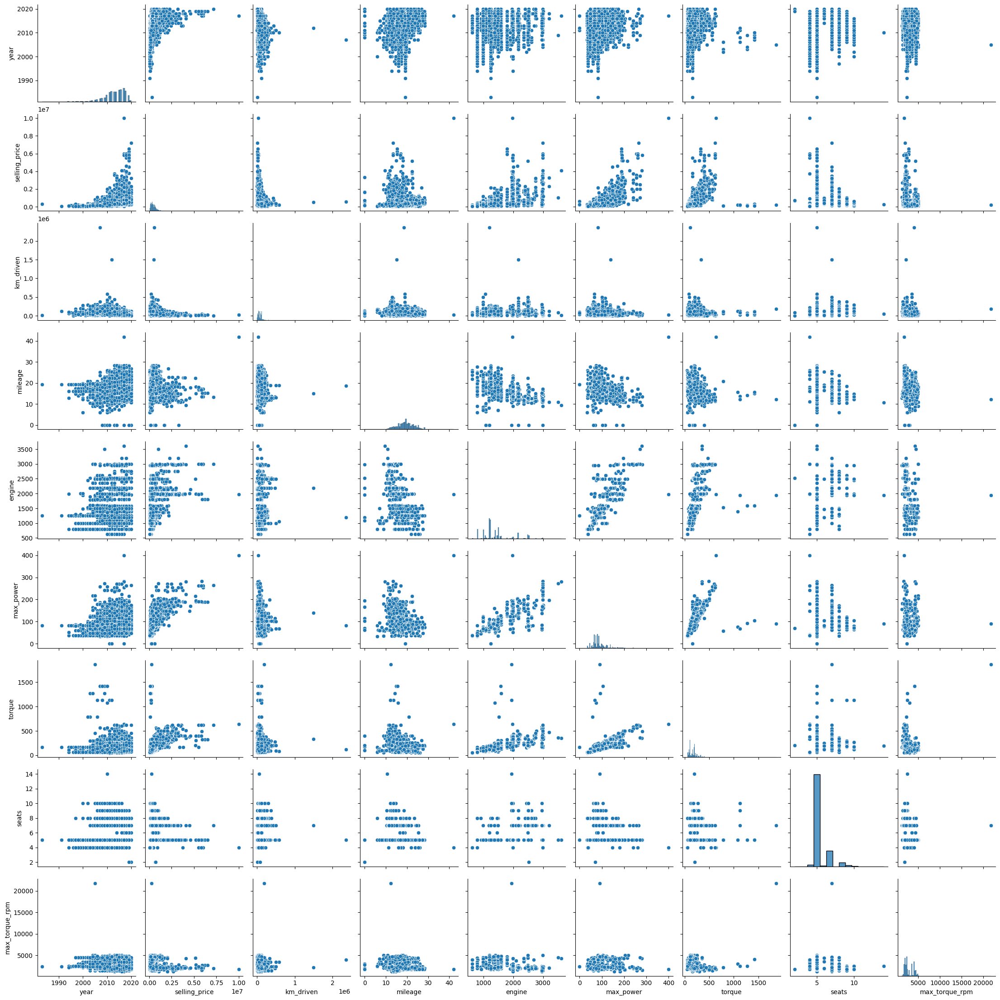

In [62]:
sns.pairplot(numeric_train)

Можно увидеть, что целевая переменная линейно зависит от 'year', 'km_driven', 'engine', 'max_power' и'torque'.

Можно сказать, что есть положительная корреляция между 'engine' и 'max_power', 'engine' и 'torque', 'max_power' и 'torque'

In [177]:
numeric_test = df_test.select_dtypes(include=np.number)

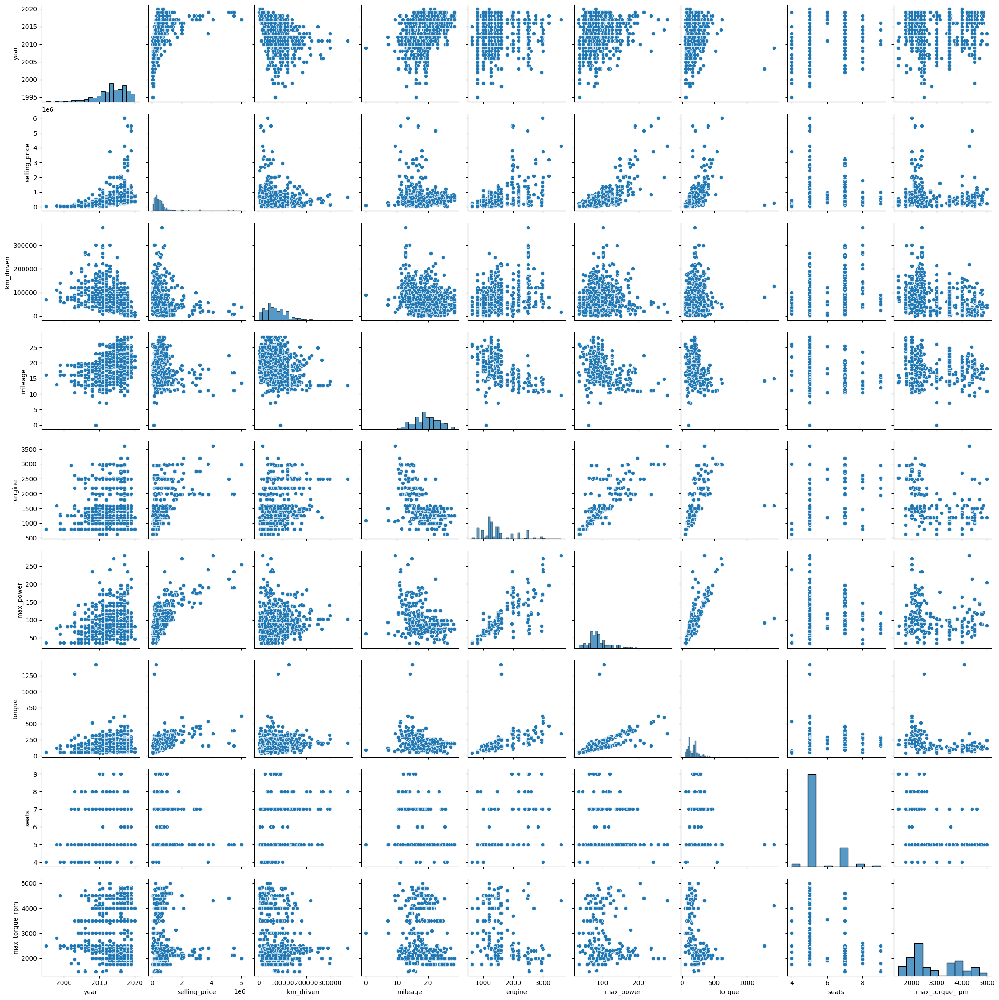

In [64]:
sns.pairplot(numeric_test)

Да, распределение тренировочных и тестовых данных схоже

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [78]:
corr = numeric_train.corr()

<Axes: >

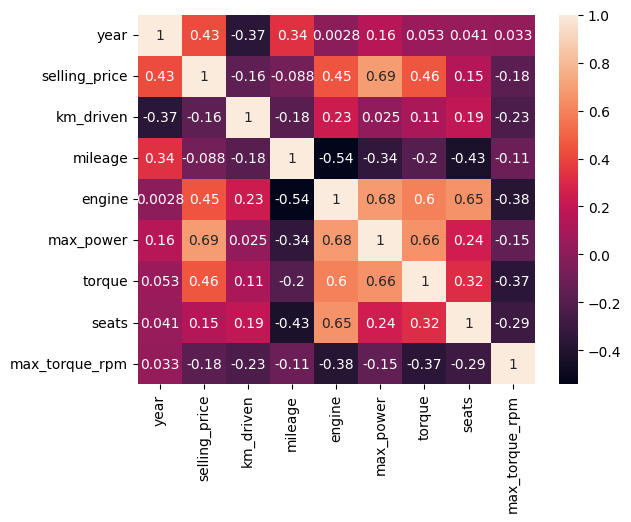

In [79]:
sns.heatmap(corr, annot=True)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1) Менее всего скоррелированы 'year' и 'engine'

2) Сильная положительная линейная зависимость наблюдается между

'selling_price' : 'max_power', 'torque'

 'engine' : 'max_power', 'torque', 'seats'

 'max_power' и 'torque'

3) Да, так можно утверждать, так как между годом и пробегом отрицательная корреляция

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [80]:
def corr_spearman(df: pd.DataFrame) -> float:
    numeric = df.select_dtypes(include=np.number)
    if numeric.empty:
        raise ValueError("В DataFrame нет численных столбцов")

    arr = numeric.to_numpy()
    size_arr = arr.shape[1]
    corr_table = np.zeros((size_arr, size_arr))

    for i in range(size_arr):
      for j in range(i, size_arr):
        rank_i = np.argsort(np.argsort(arr[:, i])) + 1
        rank_j = np.argsort(np.argsort(arr[:, j])) + 1
        d = rank_i - rank_j
        d_squared = d ** 2
        n = len(rank_i)
        corr = 1 - (6 * np.sum(d_squared)) / (n * (n**2 - 1))
        corr_table[i, j] = corr
        corr_table[j, i] = corr

    return corr_table


<Axes: >

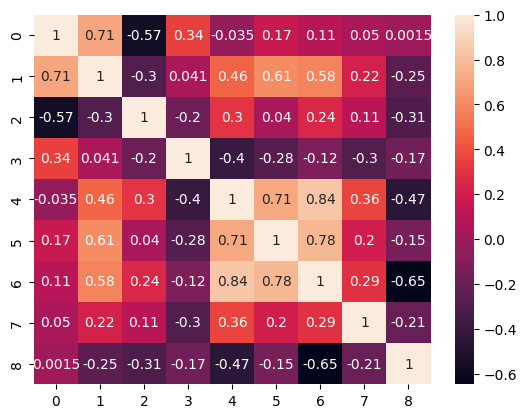

In [81]:
sns.heatmap(corr_spearman(numeric_train), annot=True)

<Axes: >

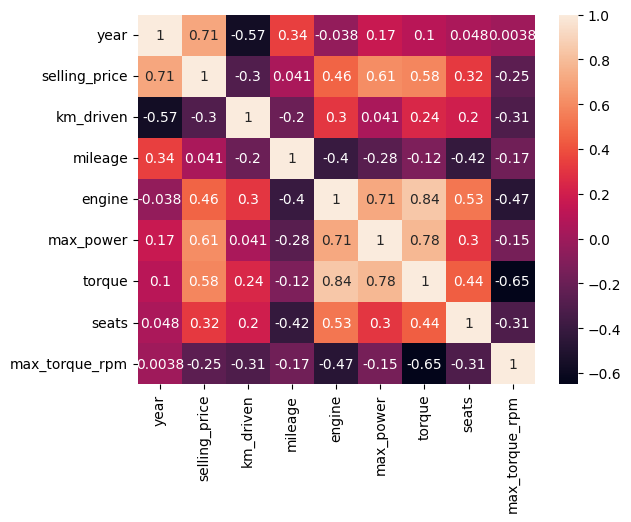

In [82]:
sns.heatmap(numeric_train.corr(method='spearman'), annot=True)

Как мы видим, наша реализация корреляции дает похожие результаты с библиотечной реализацией

`Your answer here`

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [ ]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [178]:
y_train = df_train['selling_price']
X_train = df_train.drop(['selling_price'], axis=1).select_dtypes(include=np.number)

In [179]:
assert X_train.shape == (5840, 8)

In [180]:
y_test = df_test['selling_price']
X_test = df_test.drop(['selling_price'], axis=1).select_dtypes(include=np.number)

In [181]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [182]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model = LinearRegression()
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred =  model.predict(X_train)

test_pred_model = test_pred

print(r2_score(y_train, train_pred))
print(MSE(y_train, train_pred))

print(r2_score(y_test, test_pred))
print(MSE(y_test, test_pred))

0.6017651870134334
114149365070.73315
0.599787464708495
230053593610.01578


### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [88]:
def r2_s(y: pd.DataFrame, y_pred: pd.DataFrame)->float:
  mean = y.mean()
  s1 = ((y-y_pred)**2).sum()
  s2 = ((y-mean)**2).sum()
  return 1-s1/s2

print(r2_s(y_train, train_pred))
print(r2_s(y_test, test_pred))

0.6017651870134334
0.599787464708495


mean -- это среднее значение целевой переменной

s1 -- сумма квадратов разностей истинного значения и предсказаного значения целевой переменной

s2 -- сумма квадратов разностей истинного значения и среднего значения целевой переменной

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [89]:
def adjusted_r2_s(y: pd.DataFrame, y_pred: pd.DataFrame, X_train: pd.DataFrame)->float:
  n = X_train.shape[0]
  p = X_train.shape[1]
  return 1 - (1 - r2_s(y, y_pred)) * (n - 1) / (n - p - 1)

In [90]:
print(adjusted_r2_s(y_train, train_pred, X_train))

0.6012188178651068


`Your answer here`

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [183]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scal = scaler.transform(X_train)
X_test_scal = scaler.transform(X_test)


model_scal = LinearRegression()
model_scal.fit(X_train_scal, y_train)

test_pred = model_scal.predict(X_test_scal)
train_pred =  model_scal.predict(X_train_scal)

test_pred_model_scal = test_pred

print(r2_score(y_train, train_pred))
print(MSE(y_train, train_pred))

print(r2_score(y_test, test_pred))
print(MSE(y_test, test_pred))

0.6017651870134324
114149365070.73346
0.5997874647084931
230053593610.01688


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [92]:
for i,j in zip(X_train.columns , model_scal.coef_):
  print(i,':',j)

year : 167511.96811622608
km_driven : -49739.10108963685
mileage : -15109.9047607615
engine : 14265.484972620015
max_power : 328045.63252516213
torque : 1353.4537132904952
seats : -32985.690823938625
max_torque_rpm : -66785.22216140287


Самым информативным признаком является max_power

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [184]:
from sklearn.linear_model import Lasso

lasso = Lasso(1)

lasso.fit(X_train_scal, y_train)
train_pred = lasso.predict(X_train_scal)
test_pred = lasso.predict(X_test_scal)

test_pred_lasso = test_pred

print(r2_score(y_train, train_pred))
print(MSE(y_train, train_pred))

print(r2_score(y_test, test_pred))
print(MSE(y_test, test_pred))


0.6017651869671663
114149365083.99506
0.5997862245160812
230054306508.0297


In [94]:
for i,j in zip(X_train.columns , lasso.coef_):
  print(i,':',j)

year : 167509.88307323057
km_driven : -49738.11060348764
mileage : -15106.81271985505
engine : 14263.490376192673
max_power : 328047.13431391557
torque : 1352.7560658006034
seats : -32981.71556418229
max_torque_rpm : -66783.19387947577


Как мы видим, веса не занулились и почти не поменялись. Lasso обычно занижает те веса, которые меньше всего влияют на результат. Малое изменение весов говорит о том, что все признаки влияют на результат.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [95]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
import time


param_grid = {
    'alpha': np.logspace(-4, 4, 100),  # Диапазон значений для коэффициента регуляризации
}

lasso = Lasso()

start_time = time.time()

grid_search_lasso = GridSearchCV(
    estimator=lasso,
    param_grid=param_grid,
    cv=10,
    verbose=1,
    n_jobs=-1,
    scoring='neg_mean_squared_error'
)

grid_search_lasso.fit(X_train_scal, y_train)

end_time = time.time()

training_time = end_time - start_time
print(f'Время обучения: {training_time:.2f} секунд')

best_params = grid_search_lasso.best_params_
best_lasso_model = grid_search_lasso.best_estimator_
print("Лучшие параметры:", best_params)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Время обучения: 4.81 секунд
Лучшие параметры: {'alpha': 8302.175681319752}


alpha -- коэффицент регуляризации

In [186]:
train_pred = best_lasso_model.predict(X_train_scal)
test_pred = best_lasso_model.predict(X_test_scal)

test_pred_best_lasso = test_pred

print(r2_score(y_train, train_pred))
print(MSE(y_train, train_pred))

print(r2_score(y_test, test_pred))
print(MSE(y_test, test_pred))

0.599629171461887
114761629019.13501
0.5885139920724622
236533907602.41595


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [187]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
import numpy as np

elastic_net = ElasticNet()
param_grid = {
    'alpha': np.logspace(-4, 4, 50),
    'l1_ratio': np.linspace(0, 1, 21)
}

start_time = time.time()

grid_search = GridSearchCV(
    estimator=elastic_net,
    param_grid=param_grid,
    cv=10,
    scoring='neg_mean_squared_error',
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train_scal, y_train)

end_time = time.time()

training_time = end_time - start_time
print(f'Время обучения: {training_time:.2f} секунд')

best_params = grid_search.best_params_
print("Лучшие параметры:", best_params)

best_model = grid_search.best_estimator_

train_pred = best_model.predict(X_train_scal)
print("R^2 на трейне:", r2_score(y_train, train_pred))
print("MSE на трейне:", mean_squared_error(y_train, train_pred))


test_pred = best_model.predict(X_test_scal)

test_pred_best_elastic = test_pred
print("R^2 на тесте:", r2_score(y_test, test_pred))
print("MSE на тесте:", mean_squared_error(y_test, test_pred))


Fitting 10 folds for each of 1050 candidates, totalling 10500 fits
Время обучения: 41.33 секунд
Лучшие параметры: {'alpha': 6866.488450042998, 'l1_ratio': 1.0}
R^2 на трейне: 0.6000573412148255
MSE на трейне: 114638899152.61763
R^2 на тесте: 0.5903745082406959
MSE на тесте: 235464429780.68826


alpha -- коэффицент регуляризации
l1_ratio -- баланс между l1 и l2 регуляризацией

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [112]:
df_train.select_dtypes(include='number').columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'seats', 'max_torque_rpm'],
      dtype='object')

In [156]:
df_train_cat = df_train
df_test_cat = df_test

In [157]:
df_train_cat['name'] = df_train_cat['name'].apply(lambda x: x.split()[0] + x.split()[1] if len(x.split())>=2 else x.split()[0])

In [158]:
df_test_cat['name'] = df_test_cat['name'].apply(lambda x: x.split()[0] + x.split()[1] if len(x.split())>=2 else x.split()[0])

In [159]:
df_train_cat['name'].unique().shape

(205,)

In [160]:
X_train_cat = df_train_cat.drop('selling_price', axis=1)
y_train_cat = df_train_cat['selling_price']

X_test_cat = df_test_cat.drop('selling_price', axis=1)
y_test_cat = df_test_cat['selling_price']

In [161]:
assert X_train_cat.shape == (5840, 13)

In [162]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,205,4,3,2,5
top,MarutiSwift,Diesel,Individual,Manual,First Owner
freq,558,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [163]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train_cat[['year', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'max_torque_rpm']])


X_train_cat_scal = X_train_cat
X_train_cat_scal[['year', 'km_driven', 'mileage', 'engine', 'max_power','torque', 'max_torque_rpm']] = scaler.transform(X_train_cat[['year', 'km_driven', 'mileage', 'engine', 'max_power','torque', 'max_torque_rpm']])

X_test_cat_scal = X_test_cat
X_test_cat_scal[['year', 'km_driven', 'mileage', 'engine', 'max_power','torque', 'max_torque_rpm']] = scaler.transform(X_test_cat[['year', 'km_driven', 'mileage', 'engine', 'max_power','torque', 'max_torque_rpm']])


In [164]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

encoded_columns = ohe.fit_transform(X_train_cat_scal[['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']])

encoded_column_names = ohe.get_feature_names_out(['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats'])

encoded_df = pd.DataFrame(encoded_columns, columns=encoded_column_names)

X_train_cat_scal = pd.concat([X_train_cat_scal, encoded_df], axis=1)

X_train_cat_scal = X_train_cat_scal.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats'], axis=1)

In [165]:
encoded_columns = ohe.transform(X_test_cat_scal[['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']])

encoded_column_names = ohe.get_feature_names_out(['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats'])

encoded_df = pd.DataFrame(encoded_columns, columns=encoded_column_names)

X_test_cat_scal = pd.concat([X_test_cat_scal, encoded_df], axis=1)

X_test_cat_scal = X_test_cat_scal.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats'], axis=1)

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [166]:
print(X_train_cat_scal.isnull().sum())

year         0
km_driven    0
mileage      0
engine       0
max_power    0
            ..
seats_7      0
seats_8      0
seats_9      0
seats_10     0
seats_14     0
Length: 229, dtype: int64


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`Your answer here`

1) Для начала нужно заполнить пропущенные значения чем нибудь по типу 'missing'. Затем можно указать handle_unknown='ignore' чтобы при неизвестных значениях в столбце в test не вылетела ошибка

2) Сумма во всех закодированных столбцах всегда равна 1, значит, они линейно зависимы. Это плохо, поэтому нам надо удалить один столбец

3) Да, в целом можно удалить эти признаки. Это может помочь снизить переобучение и упростить модель

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [188]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error

param_grid = {
    'alpha': np.logspace(-4, 4, 100),  # Диапазон значений для коэффициента регуляризации
}

ridge = Ridge()

grid_search = GridSearchCV(
    estimator=ridge,
    param_grid=param_grid,
    cv=10,
    verbose=1,
    n_jobs=-1,
    scoring='r2'
)

grid_search.fit(X_train_cat_scal, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
print("Лучшие параметры:", best_params)

train_pred = best_model.predict(X_train_cat_scal)
print("R² на трейне:", r2_score(y_train, train_pred))
print("MSE на трейне:", mean_squared_error(y_train, train_pred))
test_pred = best_model.predict(X_test_cat_scal)
test_pred_best_ridge = test_pred
print("R² на тесте:", r2_score(y_test, test_pred))
print("MSE на тесте:", mean_squared_error(y_test, test_pred))

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Лучшие параметры: {'alpha': 0.3593813663804629}
R² на трейне: 0.8907572710789444
MSE на трейне: 31313154295.612415
R² на тесте: 0.9046703725043586
MSE на тесте: 54798192082.870476


# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [189]:
def business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    if y_true.shape != y_pred.shape:
        raise ValueError("y_true и y_pred должны иметь одинаковую длину")

    lower_bound = y_true * 0.9
    upper_bound = y_true * 1.1

    within_bounds = (y_pred >= lower_bound) & (y_pred <= upper_bound)

    score = np.mean(within_bounds)

    return score

print(business_metrics(y_test, test_pred_model))
print(business_metrics(y_test, test_pred_model_scal))
print(business_metrics(y_test, test_pred_lasso))
print(business_metrics(y_test, test_pred_best_lasso))
print(business_metrics(y_test, test_pred_best_elastic))
print(business_metrics(y_test, test_pred_best_ridge))

0.247
0.247
0.247
0.243
0.244
0.336


Последняя модель Ridge справляется лучше всего

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [190]:
def your_business_metrics(y_true, y_pred):
    relative_error = (y_pred - y_true) / y_true
    penalties = np.where(
        relative_error < 0,
        np.abs(relative_error)*2,
        np.abs(relative_error)
    )
    return np.mean(penalties)
print(your_business_metrics(y_test, test_pred))

print(your_business_metrics(y_test, test_pred_model))
print(your_business_metrics(y_test, test_pred_model_scal))
print(your_business_metrics(y_test, test_pred_lasso))
print(your_business_metrics(y_test, test_pred_best_lasso))
print(your_business_metrics(y_test, test_pred_best_elastic))
print(your_business_metrics(y_test, test_pred_best_ridge))

0.5248765732204924
0.94982069000839
0.9498206900084422
0.9498155579395168
0.9155771348194075
0.921367484800468
0.5248765732204924


Как мы видим, обычная Lasso модель справляется лучше всего

Если модель идеально предсказывает результат, то такая метрика стремиться к нулю. Причем за недопрогноз штраф в два раза больше


# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

Тут я понял, что моя предобработка данных руками тут не прокатит, поэтому переписал ее немного (ее же я вставил и в самое начало)

In [191]:
df_train = pd.read_csv(CARS_TRAIN)
df_test = pd.read_csv(CARS_TEST)
df_train_without_price = df_train.drop('selling_price', axis=1)
duplicates = df_train_without_price[df_train_without_price.duplicated(keep=False)]
df_train = df_train.drop_duplicates(subset=df_train_without_price.columns, keep='first').reset_index(drop=True)

In [200]:
df_test.to_csv('test_df.csv', index=False)

In [192]:
import re

def transform_name(x):
  if pd.isna(x):
    return np.nan
  if len(x.split()) >=2:
    return x.split()[0] + x.split()[1]
  return x.split()[0]

def transform_mil(row):
  if pd.isna(row['mileage']):
    return np.nan
  unit_mileage = re.sub(r'[\d.]+', '', row['mileage']).strip()
  if re.sub(r'[\d.]+', '', unit_mileage).strip() == "km/kg":
    if row['fuel'] == 'Petrol':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.75
    elif row['fuel'] == 'LPG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    elif row['fuel'] == 'CNG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.13
  return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])


def transform_engine(x):
  if pd.isna(x):
    return np.nan
  return int(re.findall(r'\d+\.?\d*', str(x))[0])


def transform_max_power(row):
  if pd.isna(row):
    return np.nan
  try:
    return float(re.findall(r'\d+\.?\d*', str(row))[0])
  except:
    return np.nan


def transform_torque(row):
  if pd.isna(row['torque']):
    return row

  unit_torque = np.nan
  if not (pd.isna(row['torque'])):
    unit_torque = re.sub(r'[^a-zA-Z]|at', '', row['torque']).lower()

  numbers = re.findall(r'\d+(?:[\.,]\d+)?', row['torque'].replace(",", ""))
  for i in range(len(numbers)):
    numbers[i] = float(numbers[i].replace(',', '.'))

  #получаем наши параметры
  torque = np.nan
  max_torque_rpm = np.nan

  if(len(numbers)>=1):
    torque=numbers[0]

  if len(numbers)==2:
    max_torque_rpm = numbers[1]
  elif len(numbers)==3:
    max_torque_rpm = (numbers[1] + numbers[2])/2

  row['max_torque_rpm'] = max_torque_rpm

  if unit_torque == 'kgmrpm':
    row['torque'] = torque*9.807
  elif unit_torque == 'nmrpm':
    row['torque'] = torque
  else:
    row['torque'] = np.nan
  return row


def transform_seats(x):
  if pd.isna(x):
    return 'missing'
  return str(x)

In [195]:
#обработаем mileage
df_test['name'] = df_test['name'].apply(transform_name)
df_train['name'] = df_train['name'].apply(transform_name)

df_test['mileage'] = df_test.apply(transform_mil, axis=1)
df_train['mileage'] = df_train.apply(transform_mil, axis=1)

#обработаем engine
df_train['engine'] = df_train['engine'].apply(transform_engine)
df_test['engine'] = df_test['engine'].apply(transform_engine)
#обработаем max_power
df_train['max_power'] = df_train['max_power'].apply(transform_max_power)
df_test['max_power'] = df_test['max_power'].apply(transform_max_power)

#обработаем torque
df_train['max_torque_rpm'] = np.nan
df_test['max_torque_rpm'] = np.nan

df_train = df_train.apply(transform_torque, axis=1)
df_test = df_test.apply(transform_torque, axis=1)

df_train['seats'] = df_train['seats'].apply(transform_seats)
df_test['seats'] = df_test['seats'].apply(transform_seats)

Создаем модель с пайплайном, которую будем использовать в нашем сервисе

In [196]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import Lasso


X_train = df_train.drop('selling_price', axis=1)
y_train = df_train['selling_price']


mileage_transformer = FunctionTransformer(func=transform_mil, validate=True)


numerical_cols = ['year', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'max_torque_rpm']

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


categorical_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

column_trans = ColumnTransformer(
    [
        ('cat', categorical_transformer, categorical_cols),
        ('num', numeric_transformer, numerical_cols)
    ],
    remainder='drop'
)

clf = Pipeline(steps=[('preprocessor', column_trans),
                      ('classifier', Lasso())])

#('mileage_transform', mileage_transformer),

clf.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32554800067227.516, tolerance: 167396789601.0057
  model = cd_fast.sparse_enet_coordinate_descent(


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['name', 'fuel',
                                                   'seller_type',
                                                   'transmission', 'owner',
                                                   'seats']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['year', 'km_driven',
                                                   'mileage', 'engine',
                                                   'max_power', 'torque',
                                                   'max_torque_rpm'])])),
                ('classifier', Lasso())])

In [197]:
X_test = df_test.drop('selling_price', axis=1)
y_test = df_test['selling_price']

y_pred = clf.predict(X_test)

In [198]:
from sklearn.metrics import r2_score, mean_squared_error as MSE

print(r2_score(y_test, y_pred))

0.8979741368083706


In [199]:
from joblib import dump
dump(clf, 'clf.joblib')

['clf.joblib']

И пишем наш сервис

In [ ]:
from fastapi import FastAPI, File, UploadFile, HTTPException
from pydantic import BaseModel
from typing import List
import pandas as pd
import numpy as np
import joblib
import re
from fastapi import File, UploadFile, HTTPException
import io
from fastapi.responses import Response

app = FastAPI()

model = joblib.load('clf.joblib')


def transform_name(x):
  if pd.isna(x):
    return np.nan
  if len(x.split()) >=2:
    return x.split()[0] + x.split()[1]
  return x.split()[0]


def transform_mil(row):
  if pd.isna(row['mileage']):
    return np.nan
  unit_mileage = re.sub(r'[\d.]+', '', row['mileage']).strip()
  if re.sub(r'[\d.]+', '', unit_mileage).strip() == "km/kg":
    if row['fuel'] == 'Petrol':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.75
    elif row['fuel'] == 'LPG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    elif row['fuel'] == 'CNG':
      return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.54
    return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])*0.13
  return float(re.findall(r'\d+\.?\d*', row['mileage'])[0])


def transform_engine(x):
  if pd.isna(x):
    return np.nan
  return int(re.findall(r'\d+\.?\d*', str(x))[0])


def transform_max_power(row):
  if pd.isna(row):
    return np.nan
  try:
    return float(re.findall(r'\d+\.?\d*', str(row))[0])
  except:
    return np.nan


def transform_torque(row):
  if pd.isna(row['torque']):
    return row

  unit_torque = np.nan
  if not (pd.isna(row['torque'])):
    unit_torque = re.sub(r'[^a-zA-Z]|at', '', row['torque']).lower()

  numbers = re.findall(r'\d+(?:[\.,]\d+)?', row['torque'].replace(",", ""))
  for i in range(len(numbers)):
    numbers[i] = float(numbers[i].replace(',', '.'))

  #получаем наши параметры
  torque = np.nan
  max_torque_rpm = np.nan

  if(len(numbers)>=1):
    torque=numbers[0]

  if len(numbers)==2:
    max_torque_rpm = numbers[1]
  elif len(numbers)==3:
    max_torque_rpm = (numbers[1] + numbers[2])/2

  row['max_torque_rpm'] = max_torque_rpm

  if unit_torque == 'kgmrpm':
    row['torque'] = torque*9.807
  elif unit_torque == 'nmrpm':
    row['torque'] = torque
  else:
    row['torque'] = np.nan
  return row


def transform_seats(x):
  if pd.isna(x):
    return 'missing'
  return str(x)


def df_transform(df):
    df.replace(pd.NA, np.nan, inplace=True)
    df.drop('selling_price', inplace = True, axis=1)
    df['name'] = df['name'].apply(transform_name)
    df['mileage'] = df.apply(transform_mil, axis=1)
    df['engine'] = df['engine'].apply(transform_engine)
    df['max_power'] = df['max_power'].apply(transform_max_power)
    df['max_torque_rpm'] = np.nan
    df = df.apply(transform_torque, axis=1)
    df['seats'] = df['seats'].apply(transform_seats)
    return df


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float

class Items(BaseModel):
    objects: List[Item]

@app.post("/predict_item")
def predict_item(item: Item) -> float:

    input_data = np.array([[ item.name, item.year, item.selling_price, item.km_driven, item.fuel, item.seller_type,
                             item.transmission, item.owner, item.mileage,
                             item.engine, item.max_power, item.torque, item.seats]])

    df=pd.DataFrame(input_data, columns=['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats'])
    df = df_transform(df)
    prediction = model.predict(df)
    return float(prediction[0])


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    input_data = np.array([[item.name, item.year, item.selling_price, item.km_driven, item.fuel, item.seller_type,
                             item.transmission, item.owner, item.mileage,
                             item.engine, item.max_power, item.torque, item.seats] for item in items])

    df=pd.DataFrame(input_data, columns=['name', 'year','selling_price', 'km_driven', 'fuel','seller_type',
       'transmission', 'owner','mileage', 'engine','max_power', 'torque',
       'seats'])
    df = df_transform(df)
    predictions = model.predict(df)
    print(predictions)
    return [float(i) for i in predictions]


@app.post("/upload")
def upload(file: UploadFile = File(...)) -> Response:
    try:
        contents = file.file.read()
        with open(file.filename, 'wb') as f:
            f.write(contents)
    except Exception:
        raise HTTPException(status_code=500, detail='Something went wrong')
    finally:
        file.file.close()
    df = pd.read_csv(io.BytesIO(contents))
    df = df_transform(df)
    predictions = model.predict(df)
    df_predict = pd.read_csv(io.BytesIO(contents))
    df_predict['predict_selling_price'] = predictions
    csv_string = df_predict.to_csv(index=False)
    return Response(content=csv_string, media_type="text/csv", headers={"Content-Disposition": "attachment; filename=predictions.csv"})


ModuleNotFoundError: No module named 'fastapi'

Протестируйте приложение на адекватность и запишите демо работы сервиса (`gif` | `mp4` | …).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем GitHub-репозитории, который создали в первом ДЗ. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)
    * демо работы сервиса

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

## Заключительная часть

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Теперь можно отдохнуть и похвалить себя. Но пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой :)


Поделитесь впечатлениями о задании:

###    Жеска, но мне нравится)

P.S Удачного кодинга!  
Пейте черничный латте, пишите красивый Python!!